# Initialisation

Inspiré du site https://pulse.climate.copernicus.eu/
Ce cahier trace l'évolution des anomalies de températures
* Documentation : données ERA 5 mensuelles https://cds.climate.copernicus.eu/datasets/reanalysis-era5-single-levels-monthly-means?tab=documentation
* Source des données : https://cds.climate.copernicus.eu/datasets/reanalysis-era5-single-levels-monthly-means?tab=overview
* Pour faire fonctionner le script, il faut créer un compte CDS et un fichier de configuration '.cdsapirc' avec deux lignes pour que l'API du CDS fonctionne :
- url: https://cds.climate.copernicus.eu/api
- key: votre clé de 36 caractères
* données supplémentaires à télécharger pour les frontières dans imshow :  https://www.naturalearthdata.com/downloads/50m-cultural-vectors/

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['animation.embed_limit'] = 80
from matplotlib.animation import FuncAnimation
import matplotlib.gridspec as gridspec
import matplotlib.colors as colors

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np

import os
from pathlib import Path 
import xarray as xr
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cdsapi
import calendar

# Mes dossiers sur la machine windows
répertoire_données   = r"D:\Data\data_copernicus\temperature_monthly"
répertoire_principal = r"D:\Data\data_copernicus"
répertoire_animation = r"D:\Data\data_copernicus\data_animation\temperature"
 

## Fonctions de calcul

In [ ]:
def calculer_moyenne(fichier='era5_temp_climatology_1991_2020.nc', area=[70, -10, 30, 40],
                     répertoire_principal = répertoire_données,verbosité = True,an_début = 1991,durée = 30):
    """
    Charge ou télécharge les données de températures moyennes mensuelles ERA5 (par défaut sur la période pour 1991--2020)
    Entrées 
    * fichier à lire ou créer
    * extension : lat_max,lon_min, lat_min, lon_max. Par défaut : extension = [70, -10, 30, 40]. C'est le format (bizarre) du CDS !
    * répertoire_principal : où placer les données
    * verbosité : Boolean. Si True, affiche les messages (pour le débogage)
    * an_début : début de la période de référence. Par défaut 1991
    * durée : durée de la période de référence. Par défaut 30 ans
    Sortie
    """
    # teste si le répertoire existe
    if not os.path.exists(répertoire_principal):
        # s'il n'existe pas, le créer
        os.makedirs(répertoire_principal)

    if verbosité: print("J'ai créé le répertoire : ", répertoire_principal)
    
    nom_complet = Path(répertoire_principal) / fichier
    if not nom_complet.exists():
        os.chdir(répertoire_principal)
        if verbosité: print("* Téléchargement des données de référence climatologique...")
        c = cdsapi.Client()
        c.retrieve(
            "reanalysis-era5-single-levels-monthly-means",
            {
                "product_type": "monthly_averaged_reanalysis",
                "variable": "2m_temperature",
                "year": [str(an) for an in range(an_début, durée)],
                "month": [f"{mois:02d}" for mois in range(1, 13)],
                "time": "00:00",
                "format": "netcdf",
                "area": area
            },
            fichier
        )
    else:
        if verbosité: print(f"* J'ai trouvé le fichier {fichier} et l'ai chargé...")

    ds = xr.open_dataset(nom_complet)
    ds.load()

    # Détection automatique de la coordonnée temporelle pour débogage
    nom_variable_temps = None
    for coord in ds.coords:
        if np.issubdtype(ds[coord].dtype, np.datetime64):
            nom_variable_temps = coord
            break
    if verbosité: 
        if nom_variable_temps is None:
            raise ValueError("Aucune coordonnée temporelle de type datetime64 trouvée dans le fichier.")

    if verbosité: print(f"* Nom de la variable pour la coordonnée temporelle : {nom_variable_temps}")

    # Calcul climatologie mensuelle
    moyenne = ds.t2m.groupby(f"{nom_variable_temps}.month").mean(nom_variable_temps)
    return moyenne


def calculer_anomalie_temperature(an, moyenne, extension=[70, -10, 30, 40], 
                                  répertoire = répertoire_données, conversion_celsius=True,verbosité = True):
    """
    Calcule les anomalies de températures pour une année donnée par rapport à la moyenne climatologique fournie.
    Entrées : 
    * année : integer (entre 1940 et 2024)
    * moyenne : xarray avec le cumul moyen de température sur la période de référence
    Sortie :
    * data : dictionnaire ('lat','lon', 'anomalie') anomalie en °C par rapport à la période de référence
    """
    nom_fichier_complet = Path(répertoire) / f"era5_temp_{an}.nc"

    if not os.path.exists(nom_fichier_complet):
        print(f"* Téléchargement des données ERA5 pour {an}...")
        import cdsapi
        c = cdsapi.Client()
        c.retrieve(
            "reanalysis-era5-single-levels-monthly-means",
            {
                "product_type": "monthly_averaged_reanalysis",
                "variable": "2m_temperature",
                "year": str(an),
                "month": [f"{mois:02d}" for mois in range(1, 13)],
                "time": "00:00",
                "format": "netcdf",
                "area": extension
            },
            nom_fichier_complet
        )
    else:
        if verbosité: print(f"* J'ai trouvé le fichier {nom_fichier_complet} et l'ai chargé.")

    ds = xr.open_dataset(nom_fichier_complet)
    ds.load()

    # Détection automatique de la coordonnée temporelle pour le débogage
    nom_variable_temporelle = None
    for coord in ds.coords:
        if np.issubdtype(ds[coord].dtype, np.datetime64):
            nom_variable_temporelle = coord
            break
    if verbosité: 
        if nom_variable_temporelle is None:
            raise ValueError("* Aucune coordonnée temporelle de type datetime64 trouvée dans le fichier.")

    if verbosité: print(f"* Utilisation de la coordonnée temporelle : {nom_variable_temporelle}")

    # Groupement par mois et calcul de l'anomalie
    temp_monthly = ds.t2m.groupby(f"{nom_variable_temporelle}.month")
    anomalies = temp_monthly - moyenne
    anomalies_moyenne = anomalies.mean(nom_variable_temporelle)

    if conversion_celsius and anomalies_moyenne.attrs.get('units') == 'K':
        anomalies_moyenne = anomalies_moyenne - 273.15
    if verbosité: 
        print(f"* Anomalies {an} calculées :")
        print(f"   - Résolution: {len(ds.latitude)} x {len(ds.longitude)} points")
        print(f"   - Anomalies min et max: {float(anomalies_moyenne.min()):.1f} °C et {float(anomalies_moyenne.max()):.1f} °C")

    # Mise en forme des données
    lats_2d, lons_2d = np.meshgrid(ds.latitude.values, ds.longitude.values, indexing='ij')
    anomalies_flat = anomalies_moyenne.values.flatten()

    masque = ~np.isnan(anomalies_flat)
    data = {
        'lat': lats_2d.flatten()[masque],
        'lon': lons_2d.flatten()[masque],
        'anomalie': anomalies_flat[masque]
    }

    return data


## Fonctions de traçage

In [15]:

def tracer_temperature_anomalies(data, cmap='RdBu_r', vmin=-4, vmax=4,extension=(30, 70, -10, 40)):
    """
    Affiche les anomalies de température sur une projection géo ou orthographique centrée sur l'Europe.
    Entrées :
    * dictionnaire avec pour clés 'lat', 'lon' et 'anomalie' 
    * cmap : color map, par défaut 'RdBu_r'
    * vmin=-4, vmax=4 : valeurs minimales et maximales en °C de la barre de couleur 
    * extension=(30, 70, -10, 40) lat_min, lat_max, lon_min, lon_max
    """
    fig = plt.figure(figsize=(10, 10))
    #center_lon=10, center_lat=50, 
    #ax = plt.axes(projection=ccrs.Orthographic(central_longitude=center_lon, central_latitude=center_lat))
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.set_extent([extension[2], extension[3], extension[0], extension[1]], crs=ccrs.PlateCarree())
    # Ajouter les côtes et les frontières
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5, edgecolor='gray')
    ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor='gray')
    # Convertir les coordonnées en projection
    sc = ax.scatter(
        data['lon'], data['lat'],
        c=data['anomalie'],
        cmap=cmap,
        s=10,
        vmin=vmin,
        vmax=vmax,
        transform=ccrs.PlateCarree(),
        alpha=0.85
    )
    # Légende (barre de couleur)
    cb = plt.colorbar(sc, orientation='horizontal', shrink=0.7, pad=0.05)
    cb.set_label("Anomalie de température (°C)")

    #ax.set_title("Anomalies de température de surface", fontsize=14)
    plt.tight_layout()
    plt.show()

def tabuler_temperature_anomalies(data, an, ax, cmap='RdBu_r', vmin=-4, vmax=4,extension=(30, 70, -10, 40),légende = False):
    """
    Affiche les anomalies de température 'data' correspondant à l'année 'an' pour l'axe 'ax' d'une grille
    sur une projection géo ou orthographique centrée sur l'Europe.
    Entrées :
    * dictionnaire avec pour clés 'lat', 'lon' et 'anomalie'"Atelier écriture"
    * cmap : color map, par défaut 'RdBu_r'
    * vmin=-100, vmax=100 : valeurs minimales et maximales de la barre de couleur 
    * extension=(30, 70, -10, 40) lat_min, lat_max, lon_min, lon_max
    * légende : Boolean. Ajoute un légende sous la forme d'une barre de couleurs
    Sortie :
    * sc : scatter plot (pour faire une barre de couleurs globale)
    """
 
    ax.set_extent([extension[2], extension[3], extension[0], extension[1]], crs=ccrs.PlateCarree()) 
    # Ajouter les côtes   et frontières
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5, edgecolor='gray')
    ax.add_feature(cfeature.BORDERS, linewidth=0.5, edgecolor='gray')
    # Convertir les coordonnées en projection
    sc = ax.scatter(
        data['lon'], data['lat'],
        c=data['anomalie'],
        cmap=cmap,
        s=10,
        vmin=vmin,
        vmax=vmax,
        transform=ccrs.PlateCarree(),
        alpha=0.85
    )

    ax.text(0.1, 0.1,  str(an),
        horizontalalignment='center',
        verticalalignment='center',
        transform = ax.transAxes,fontsize=12)

    # Ajouter une barre de couleur
    if légende:
        cb = plt.colorbar(sc, orientation='horizontal', shrink=0.7, pad=0.05)
        cb.set_label("Anomalie de température (°C)")
    return sc
 

In [28]:
def tracer_tableau_température(an_début,clim,nrows=6, ncols = 3,  extension =  [-10, 40, 30, 70], vmin = -4, vmax = 4,espacement = 0.02,plot_aspect = None):
    """" trace un tableau 
    Entrée :
    * an_début : année de début. L'année finale sera an_début+ncols*nrows-1
    * ncols : nombre de colonnes
    * nrows : nombre de lignes
    * extension : lon_min, lon_max, lat_min, lat_max. Par défaut : extension = [-10, 40, 30, 70]
    * vmin = -4, vmax = 4 : valeurs pour la barre de couleurs
    * espacement = 0.02 : espacement entre éléments de la grille
    """
    if plot_aspect is None:
        plot_aspect =  (extension[3]-extension[2])/(extension[1]-extension[0])  # lat/lon 
        print(plot_aspect)

    #figsize = (14, 19)
    figsize  =(16, 16*plot_aspect*nrows/ncols)
    # ajustement pour l'Europe
    fig = plt.figure(figsize=figsize)   

    # ajustement pour nrows lignes * ncols colonnes
    gs = gridspec.GridSpec(nrows, ncols, figure=fig,
                left=0.04, right=0.96,        # bordures gauche et droite
                bottom=0.04, top=0.96,        # bordures haut et bas
                wspace=espacement, hspace=espacement)     # espacement

    # 3. Manually enforce equal cell sizes
    for i in range(nrows* ncols):
        ax = fig.add_subplot(gs[i], projection=ccrs.PlateCarree())
        
        # extension + projection géographique
        ax.set_extent(extension, crs=ccrs.PlateCarree())
        # forcer l'aspect ration pour compenser l'argument par défaut de Cartopy
        ax.set_aspect('auto')   
        # détermination de l'année et calcul des anomalies
        an = an_début + i
        data = calculer_anomalie_temperature(an, clim,verbosité=False)
        sc = ax.scatter(data['lon'], data['lat'], c=data['anomalie'],
                        cmap='RdBu_r', s=10, vmin=vmin, vmax=vmax,
                        transform=ccrs.PlateCarree())
        
        ax.add_feature(cfeature.COASTLINE, linewidth=0.3)
        ax.add_feature(cfeature.BORDERS, linewidth=0.2)
        ax.text(0.05, 0.05, str(an), 
            transform=ax.transAxes,
            fontsize=11,
            bbox=dict(facecolor='white', 
                    edgecolor='none',   
                    alpha=0.7,        
                    boxstyle='round,pad=0.2'))  
    
        # légende
        cbar_ax = fig.add_axes([0.3, 0.02, 0.4, 0.01])  # [left, bottom, width, height]
        fig.colorbar(sc, cax=cbar_ax, orientation='horizontal')
        cbar_ax.set_xlabel("Anomalie de température (°C)")

    plt.show()
    return fig

# Résultats

## Mosaïque 2007-2024

J'ai créé le répertoire :  D:\Data\data_copernicus\temperature_monthly
* J'ai trouvé le fichier era5_temp_climatology_1991_2020.nc et l'ai chargé...
* Nom de la variable pour la coordonnée temporelle : valid_time


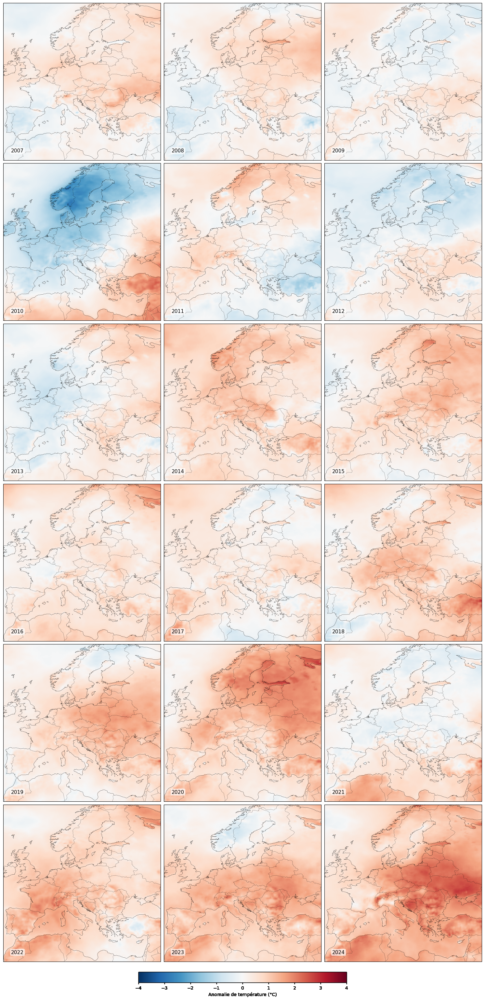

In [30]:
climatologie = calculer_moyenne()
fig = tracer_tableau_température(2007,climatologie,plot_aspect=1)

In [31]:
fig.savefig(Path(répertoire_principal) / 'anomalies_temperature_2007-2024.png',dpi= 200, bbox_inches = 'tight')

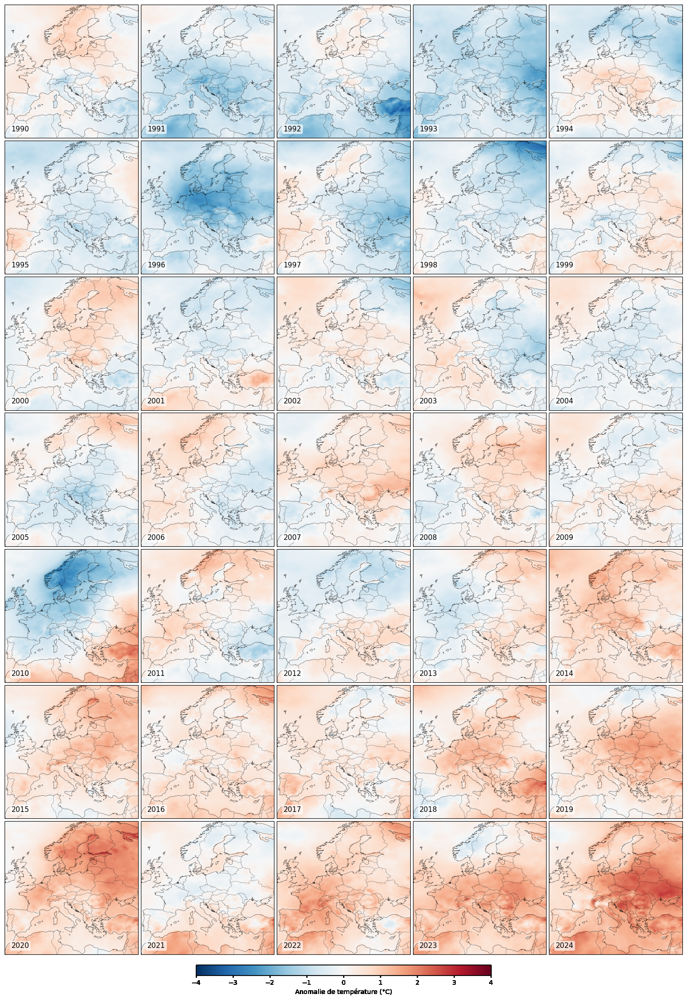

In [32]:
#climatologie = calculer_moyenne()
fig = tracer_tableau_température(1990,climatologie,ncols=5,nrows=7,plot_aspect=1)

In [33]:
fig.savefig(Path(répertoire_principal) / 'anomalies_temperature_1990-2024.png',dpi= 200, bbox_inches = 'tight')

## carte seule

J'ai créé le répertoire :  D:\Data\data_copernicus\temperature_monthly
* J'ai trouvé le fichier era5_temp_climatology_1991_2020.nc et l'ai chargé...
* Nom de la variable pour la coordonnée temporelle : valid_time
* J'ai trouvé le fichier D:\Data\data_copernicus\temperature_monthly\era5_temp_2010.nc et l'ai chargé.
* Utilisation de la coordonnée temporelle : valid_time
* Anomalies 2010 calculées :
   - Résolution: 161 x 201 points
   - Anomalies min et max: -3.1 °C et 2.4 °C


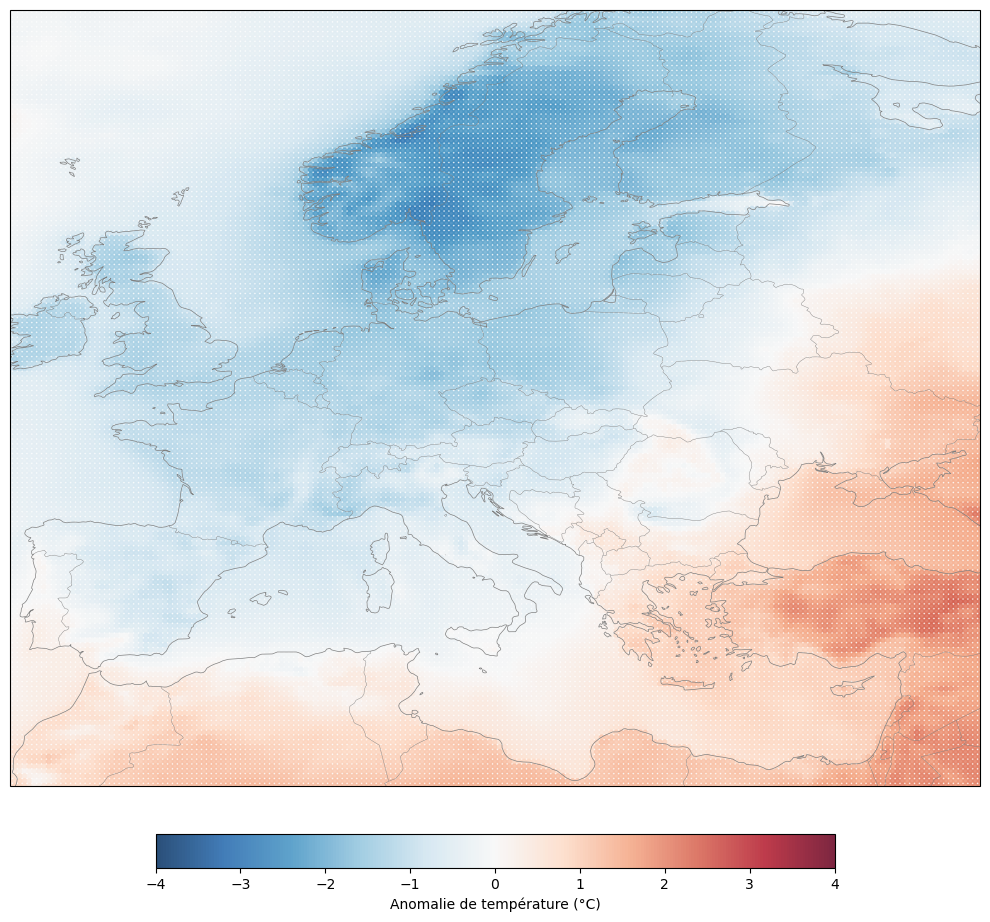

In [8]:
climato_1991_2020 = calculer_moyenne()
data = calculer_anomalie_temperature(2010, climato_1991_2020)
tracer_temperature_anomalies(data)


## mosaïque de 2*2

C:\Users\ancey\AppData\Local\Temp\ipykernel_30096\3864817647.py:23: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  plt.subplots_adjust(


* J'ai trouvé le fichier D:\Data\data_copernicus\era5_temp_2010.nc et l'ai chargé.
* Utilisation de la coordonnée temporelle : valid_time
* Anomalies 2010 calculées :
   - Résolution: 161 x 201 points
   - Anomalies min et max: -3.1 °C et 2.4 °C
* J'ai trouvé le fichier D:\Data\data_copernicus\era5_temp_2011.nc et l'ai chargé.
* Utilisation de la coordonnée temporelle : valid_time
* Anomalies 2011 calculées :
   - Résolution: 161 x 201 points
   - Anomalies min et max: -1.5 °C et 1.6 °C
* J'ai trouvé le fichier D:\Data\data_copernicus\era5_temp_2012.nc et l'ai chargé.
* Utilisation de la coordonnée temporelle : valid_time
* Anomalies 2012 calculées :
   - Résolution: 161 x 201 points
   - Anomalies min et max: -1.5 °C et 1.0 °C
* J'ai trouvé le fichier D:\Data\data_copernicus\era5_temp_2013.nc et l'ai chargé.
* Utilisation de la coordonnée temporelle : valid_time
* Anomalies 2013 calculées :
   - Résolution: 161 x 201 points
   - Anomalies min et max: -1.1 °C et 1.5 °C


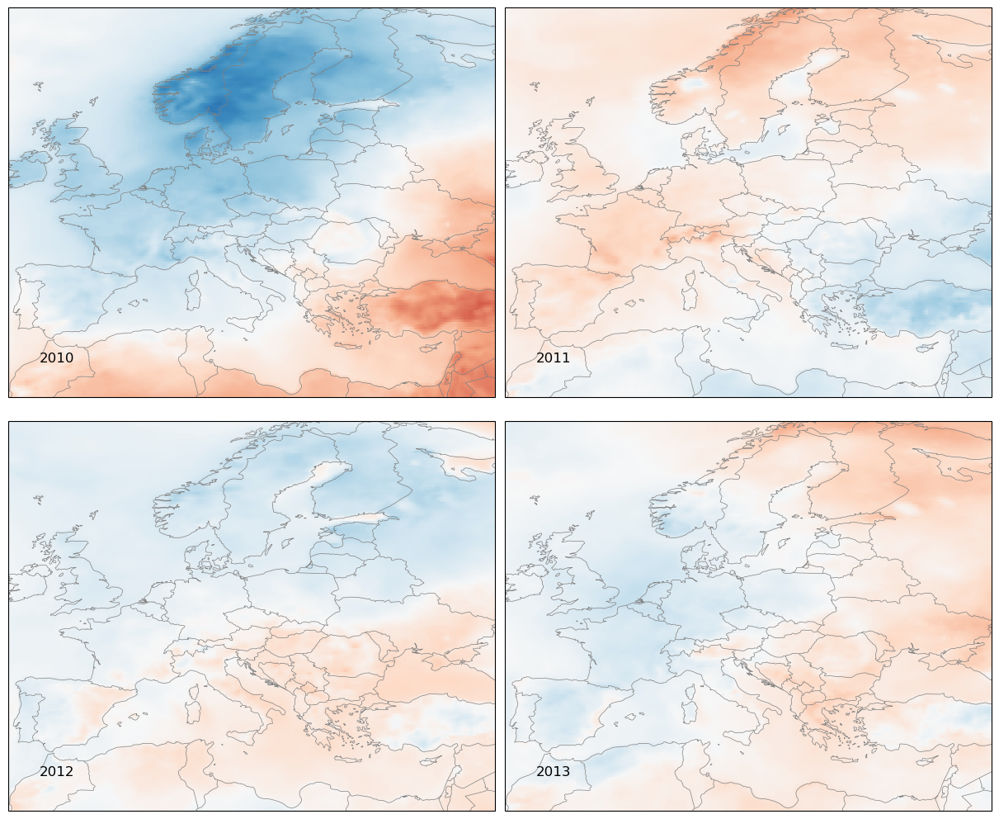

In [ ]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, subplot_kw={'projection': ccrs.PlateCarree()}, constrained_layout=True)  # Ajustement automatique),    constrained_layout=True

lat_range = 70 - 30   
lon_range = 40 - (-10)   
aspect_ratio = lon_range / lat_range   

# Ajustez la taille de figure en conséquence
fig_height = 15
fig_width = fig_height * aspect_ratio * 2   
# plt.subplots_adjust(
#     left=0.05,    # marge gauche
#     right=0.95,   # marge droite  
#     top=0.95,     # marge haute
#     bottom=0.05,  # marge basse
#     wspace=0.1,   # espacement horizontal entre subplots
#     hspace=0.1    # espacement vertical entre subplots
# )

fig.set_figheight(10)
fig.set_figwidth(12)

# Ajustement fin des espacements
plt.subplots_adjust(
    left=0.08,
    right=0.92,
    top=0.92,
    bottom=0.08,
    wspace=0.25,    # Augmentez ceci pour plus d'espace horizontal
    hspace=0.15     # Gardez ceci plus petit pour l'espace vertical
)
 
axes = (ax1, ax2, ax3, ax4)
for i in range(4):
    an = 2010+i
    data = calculer_anomalie_temperature(an, climato_1991_2020)
    tabuler_temperature_anomalies(data, an, ax=axes[i] ) 
 
 

In [ ]:
fig.savefig(Path(répertoire_principal) /"cartes_anomalies.png",dpi=300,bbox_inches = 'tight')

## mosaïque de 6*4 avec imshow (sans Cartopy)

### 1990-2024

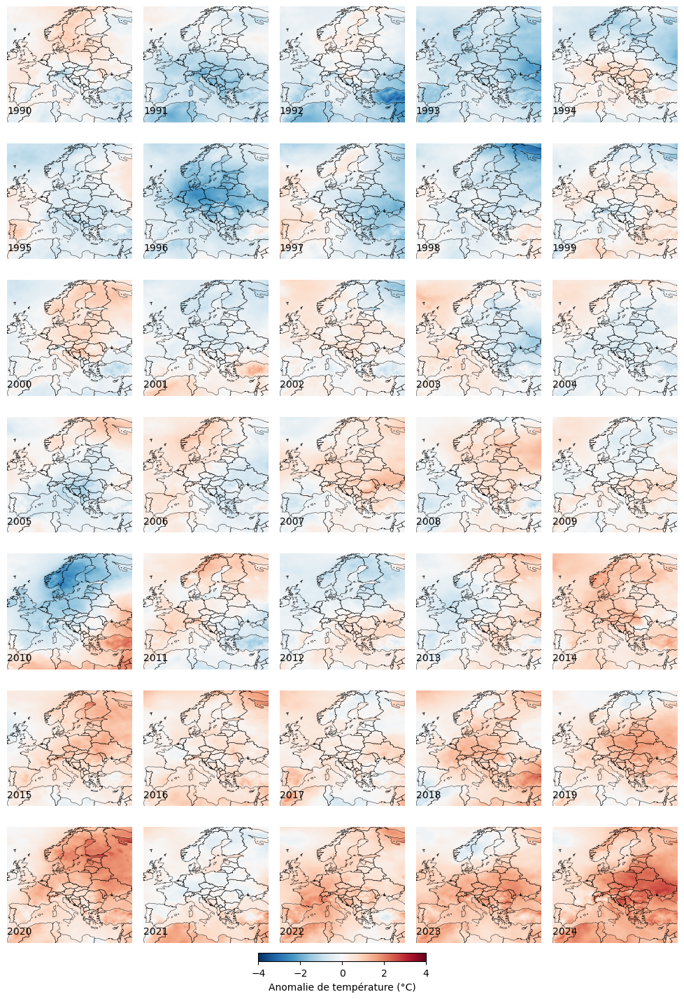

In [19]:
nrows, ncols = 7, 5
hgap, vgap = 0.01, 0.01
left, right = 0.05, 0.95
bottom, top = 0.05, 0.95

axes = []
width = (right - left - (ncols - 1) * hgap) / ncols
height = (top - bottom - (nrows - 1) * vgap) / nrows

#facteur_optimal = (lat_extent / lon_extent) * (figsize[0] / figsize[1]) * (nrows / ncols)
width *= 0.65  # compress horizontal
 
world = gpd.read_file(r"D:\Data\Cartographie\50m_cultural\ne_50m_admin_0_countries.shp")
world_europe = world.cx[-10:40, 30:70]

fig = plt.figure(figsize=(16, 16))

for i in range(nrows * ncols):
    row = i // ncols
    col = i % ncols
    x = left + col * (width + hgap) + 0.15 * width  # recentre
    y = top - (row + 1) * (height + vgap)
    ax = fig.add_axes([x, y, width, height])
    ax.set_xlim(-10, 40)
    ax.set_ylim(30, 70)
    ax.set_aspect("auto")
    ax.axis("off")
    axes.append(ax)

for i in range(nrows * ncols):
    ax = axes[i]
    an = 1990 + i
    data = calculer_anomalie_temperature(an, climato_1991_2020, verbosité=False)

    # Conversion en DataFrame
    df = pd.DataFrame(data)
    df = df.round({'lat': 3, 'lon': 3})
    pivot = df.pivot(index='lat', columns='lon', values='anomalie')

    anom = pivot.values
    lon = pivot.columns.values
    lat = pivot.index.values

    im = ax.imshow(anom, origin='lower',
                   extent=[lon.min(), lon.max(), lat.min(), lat.max()],
                   cmap='RdBu_r', vmin=-4, vmax=4, aspect='auto')
    
    ax.set_xlim(-10, 40)
    ax.set_ylim(30, 70)
    ax.set_aspect('auto')

    # Tracer les frontières 
    world_europe.plot(ax=ax, edgecolor='black', facecolor='none', linewidth=0.3)
    ax.text(0.1, 0.1,  str(an),
            horizontalalignment='center',
            verticalalignment='center',
            transform = ax.transAxes,fontsize=10)

    ax.set_xlim(lon.min(), lon.max())
    ax.set_ylim(lat.min(), lat.max())
    ax.axis('off')

# Colorbar
cbar = fig.colorbar(im, ax=axes, orientation='horizontal',shrink=0.25,
                    fraction=0.05, pad=0.01)
cbar.set_label("Anomalie de température (°C)")

plt.show()


In [20]:
fig.savefig(Path(répertoire_principal) /"carte_anomalies_1990_2024.png",dpi=300,bbox_inches = 'tight')

### 1955-1989

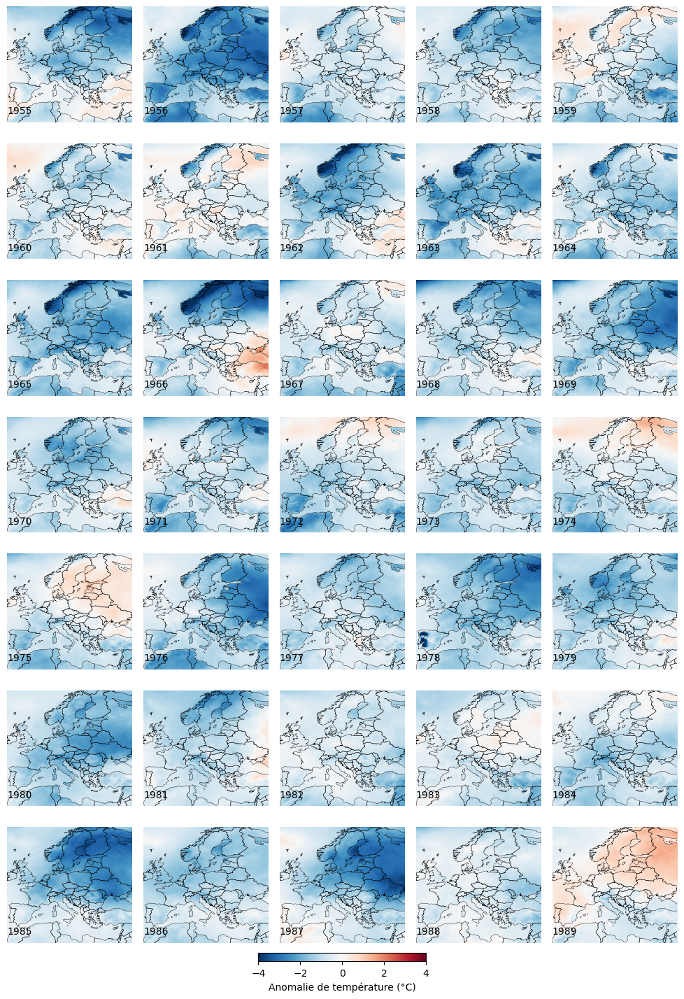

In [22]:
nrows, ncols = 7, 5
hgap, vgap = 0.01, 0.01
left, right = 0.05, 0.95
bottom, top = 0.05, 0.95

axes = []
width = (right - left - (ncols - 1) * hgap) / ncols
height = (top - bottom - (nrows - 1) * vgap) / nrows

#facteur_optimal = (lat_extent / lon_extent) * (figsize[0] / figsize[1]) * (nrows / ncols)
width *= 0.65  # compress horizontal
 
world = gpd.read_file(r"D:\Data\Cartographie\50m_cultural\ne_50m_admin_0_countries.shp")
world_europe = world.cx[-10:40, 30:70]

fig = plt.figure(figsize=(16, 16))
for i in range(nrows * ncols):
    row = i // ncols
    col = i % ncols
    x = left + col * (width + hgap) + 0.15 * width  # recentre
    y = top - (row + 1) * (height + vgap)
    ax = fig.add_axes([x, y, width, height])
    ax.set_xlim(-10, 40)
    ax.set_ylim(30, 70)
    ax.set_aspect("auto")
    ax.axis("off")
    axes.append(ax)

for i in range(nrows * ncols):
    ax = axes[i]
    an = 1955 + i
    data = calculer_anomalie_temperature(an, climato_1991_2020, verbosité=False)

    # Conversion en DataFrame
    df = pd.DataFrame(data)
    df = df.round({'lat': 3, 'lon': 3})
    pivot = df.pivot(index='lat', columns='lon', values='anomalie')

    anom = pivot.values
    lon = pivot.columns.values
    lat = pivot.index.values

    im = ax.imshow(anom, origin='lower',
                   extent=[lon.min(), lon.max(), lat.min(), lat.max()],
                   cmap='RdBu_r', vmin=-4, vmax=4, aspect='auto')
    
     
    ax.set_xlim(-10, 40)
    ax.set_ylim(30, 70)
    ax.set_aspect('auto')

    # Trace les frontières 
    world_europe.plot(ax=ax, edgecolor='black', facecolor='none', linewidth=0.3)

    ax.text(0.1, 0.1,  str(an),
            horizontalalignment='center',
            verticalalignment='center',
            transform = ax.transAxes,fontsize=10)

    ax.set_xlim(lon.min(), lon.max())
    ax.set_ylim(lat.min(), lat.max())
    ax.axis('off')

# Colorbar
cbar = fig.colorbar(im, ax=axes, orientation='horizontal',shrink=0.25,
                    fraction=0.05, pad=0.01)
cbar.set_label("Anomalie de température (°C)")

plt.show()


In [ ]:
fig.savefig(Path(répertoire_principal) /"carte_anomalies_1955_1989.png",dpi=300,bbox_inches = 'tight')

# Animation

In [51]:
import os
from pathlib import Path
import cdsapi
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.animation import FuncAnimation

##### moyenne climatologiquee 1991–2020 #####
def définir_moyenne_climatologique(fichier='era5_temp_climatology_1991_2020.nc',
                     extension=[70, -10, 30, 40],an_début = 1991,durée = 30, répertoire = répertoire_animation,verbosité=True):
    """
    Calcule la moyenne mensuelle des températures sur la période de référence [an_début, an_début + durée - 1]
    Entrée : 
    * fichier : nom du fichier à lire sur le disque ou à télécharger depuis CDS (s'il n'existe pas sur le disque)
    * options : 
        - extension (au format CDS)  [North, West, South, East]  
        - répertoire : répertoire des données d'animation
        - an_début  = 1991 
        - durée     = 30 ans (donc la période 1991-2020)
        - verbosité = True (affiche les messages de progression)
    Sortie :
    * clim : xarray (avec trois dimensions : lon, lat, month)
    """
    nom_fichier_complet = Path(répertoire) / fichier
    # Si le fichier n'existe pas, le charge depuis le CDS
    if not os.path.exists(fichier):
        if verbosité: print(f"* Téléchargement moyenne climatologique pour la période de référence {an_début}-{an_début+durée}...")
        c = cdsapi.Client()
        c.retrieve(
            "reanalysis-era5-single-levels-monthly-means",
            {
                "product_type": "monthly_averaged_reanalysis",
                "variable": "2m_temperature",
                "year": [str(année) for année in range(an_début, an_début+durée)],
                "month": [f"{mois:02d}" for mois in range(1, 13)],
                "time": "00:00",
                "format": "netcdf",
                "area": extension,
            },
            nom_fichier_complet
        )
    ds = xr.open_dataset(nom_fichier_complet)
    ds.load()
    # Trouve la coordonnée temporelle (time ou valid_time) pour le débogage
    time_coord = None
    for coord in ds.coords:
        if np.issubdtype(ds[coord].dtype, np.datetime64):
            time_coord = coord
            break
    if time_coord is None:
        print(f"Aucune coordonnée temporelle trouvée dans le fichier {fichier}. Il faut modifier le script ou chercher l'erreur...")
    if verbosité: print(f"* Le nom de la variable temporelle est {time_coord}")
    clim = ds.t2m.groupby(f"{time_coord}.month").mean(time_coord)
    ds.close()
    return clim  # dimensions: month, latitude, longitude !!!

 
##### Charger les données mensuelles pour l'année spécifiée #####
def charger_températures_mensuelles(an, répertoire = répertoire_animation, extension=[70, -10, 30, 40]):
    """
    Charge depuis CDS les températures mensuelles moyennes pour l'année 'an' si le fichier n'existe pas sur le disque
    Entrée : 
    * an : année, integer (entre 1940 et 2025)
    * option : 
        - extension (au format CDS)  [North, West, South, East]  
        - répertoire : répertoire des données d'animation
    Sortie :
    * fichier : nom du fichier (adresse complète), objet Path
    """
     
    Path(répertoire).mkdir(parents=True, exist_ok=True)
    fichier = Path(répertoire) / f"era5_temp_{an}.nc" # nomenclature des fichiers
    if not fichier.exists():
        print(f"* Téléchargement ERA5 2m_temperature pour {an} ...")
        c = cdsapi.Client()
        c.retrieve(
            "reanalysis-era5-single-levels-monthly-means",
            {
                "product_type": "monthly_averaged_reanalysis",
                "variable": "2m_temperature",
                "year": str(an),
                "month": [f"{m:02d}" for m in range(1, 13)],
                "time": "00:00",
                "format": "netcdf",
                "area": extension,  # [N, W, S, E]
            },
            str(fichier)
        )
    return fichier


def calculer_anomalie_température_mensuelle(an, moyenne,
                               extension = (30, 70, -10, 40),
                               répertoire = répertoire_animation  ):
    """
    Calcule les anomalies de température pour une année donnée par rapport à la climatologie fournie.
    Entrée : 
    * an : année, integer (entre 1940 et 2025)
    * moyenne : xarray avec le cumul moyen de précipitations
    * option : 
        - extension (latitude_min, latitude_max, longitude_min, longitude_max) !!! pas le même format que CDS
        - répertoire : répertoire des données d'animation
    Sortie :
    * data_an
    """
    # s'assurer que le fichier existe sinon le télécharger
    #    On télécharge exactement la zone Europe pour limiter la taille.
    fichier = charger_températures_mensuelles(
        an, répertoire=répertoire,
        extension=[extension[1], extension[2], extension[0], extension[3]]  # -> [N, W, S, E] passage au fomat CDS
    )

    # ouvre/charge en RAM puis le ferme (afin d'éviter les erreurs HDF)
    with xr.open_dataset(fichier) as ds:
        ds.load()

    # 3) Réouvrir en mémoire (objet détaché du fichier)
    ds = xr.open_dataset(fichier, cache=False)
    time_coord = None
    for coord in ds.coords:
        if np.issubdtype(ds[coord].dtype, np.datetime64):
            time_coord = coord
            break
    if time_coord is None:
        print(f"Erreur fatale ! Aucune variable temporelle trouvée dans {fichier}.")
    # Noms lat/lon
    lat_name = "latitude"  if "latitude"  in ds.coords else "lat"
    lon_name = "longitude" if "longitude" in ds.coords else "lon"

    # Si le fichier existe, mais pas avec la bonne extension géographique, on le retaille à la bonne extension
    # pas sûr que cela marche tout le temps
    lat_min, lat_max, lon_min, lon_max = extension
    # Attention format ERA5 décroissante -> slice(lat_max, lat_min) pour les latitudes !!!
    ds = ds.sel({lat_name: slice(lat_max, lat_min),
                 lon_name: slice(lon_min, lon_max)})

    # pour calculer les anomalies, on se sert groupby sur la coordonnée <time_coord>.month, car les deux arrays
    # ds et moyenne n'ont pas le même nom de variable temporelle.  
    # On soustrait ensuite la moyenne climatologique du mois correspondant.
    def subtract_clim(da):
        # mois = 1..12 depuis la coordonnée temporelle du groupe (xarray 'moyenne')
        mois_val = int(da[time_coord].dt.month.values[0])
        return da - moyenne.sel(month=mois_val)

    anomalies = ds.t2m.groupby(f"{time_coord}.month").map(subtract_clim)

    # On veut (time, lat, lon) dans l'ordre et 12 pas de temps
    anomalies = anomalies.transpose(time_coord, lat_name, lon_name)
    ds.close()
    return anomalies


############### Animation avec une projection géographique (PlateCarree)  ###############
# à faire avec projection de Robinson
def make_animation(climato, 
                   années     = range(2005, 2026),
                   répertoire = répertoire_animation,
                   extension  = (30, 70, -10, 40),
                   vmin = -4, vmax = 4):
    """
    Construit l'animation mensuelle des anomalies t2m sur l'Europe.
    """
    # Accumuler toutes les cartes mensuelles (12 * nb années)
    all_months = []
    labels = []
    lat_name = None
    lon_name = None
    liste_mois = ['janvier', 'février', 'mars', 'avril', 'mai', 'juin', 'juillet',
              'août', 'septembre', 'octobre', 'novembre', 'décembre']
    nombre_mois = range(12)
    dico_mois = {str(i+1): liste_mois[i] for i in nombre_mois}
    # boucle
    for an in années:
        da_an = calculer_anomalie_température_mensuelle(an, climato,
                                             extension  = extension,
                                             répertoire = répertoire )
        # Mémoriser noms lat/lon
        if lat_name is None:
            lat_name = "latitude"  if "latitude"  in da_an.coords else "lat"
            lon_name = "longitude" if "longitude" in da_an.coords else "lon"

        # Itérer sur la dimension temps (12 mois)
        for month_idx in range(da_an.sizes[da_an.dims[0]]):
            da = da_an.isel({da_an.dims[0]: month_idx})
            # On stocke seulement la grille 2D (lat, lon)
            all_months.append(da)
            #labels.append(f"{month_idx+1:02d}-{an}")
            labels.append(f"{an}, {dico_mois[str(month_idx+1)]}")

        # libérer mémoire pour l'année
        del da_an

    # Préparer la figure/projection
    fig = plt.figure(figsize=(8, 8))
    ax  = plt.axes(projection=ccrs.PlateCarree())
    ax.set_extent([extension[2], extension[3], extension[0], extension[1]], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.COASTLINE, lw=0.6, edgecolor='gray')
    ax.add_feature(cfeature.BORDERS,   lw=0.3, edgecolor='gray')
    # Grilles coordonnées
    lats = all_months[0][lat_name].values
    lons = all_months[0][lon_name].values

    # Premier champ
    Z0 = all_months[0].values
    # pcolormesh attend (nlat-1) x (nlon-1) en interne
    pcm = ax.pcolormesh(lons, lats, Z0, cmap='RdBu_r', vmin=vmin, vmax=vmax,
                        transform=ccrs.PlateCarree())
    cb = fig.colorbar(pcm, orientation='horizontal', fraction=0.05, pad=0.04)
    cb.set_label("Anomalie de température mensuelle (°C)")
    title = ax.set_title(labels[0], loc='left')

    def update(i):
        Zi = all_months[i].values
        # Mise à jour des données 
        pcm.set_array(Zi.ravel())
        title.set_text(labels[i])
        return pcm, title

    ani = FuncAnimation(fig, update, frames=len(all_months), interval=200, blit=False)
    return ani


In [52]:

clim = définir_moyenne_climatologique(fichier='era5_temp_climatology_1991_2020.nc',
                        extension=[70, -10, 30, 40])
ani = make_animation(climato = clim,
                     années  = range(2005, 2026),
                     répertoire = répertoire_animation,
                     extension  = (30, 70, -10, 40),
                     vmin=-4, vmax=4)
plt.close()   # évite l’affichage de la 1ère frame statique


2025-08-02 15:23:21,209 INFO [2024-09-26T00:00:00] Watch our [Forum](https://forum.ecmwf.int/) for Announcements, news and other discussed topics.


* Téléchargement moyenne climatologique pour la période de référence 1991-2021...


2025-08-02 15:23:21,571 INFO Request ID is d712c812-3cf0-41da-a7d4-474587c4d758
2025-08-02 15:23:21,635 INFO status has been updated to accepted
2025-08-02 15:23:30,114 INFO status has been updated to successful


* Le nom de la variable temporelle est valid_time


In [ ]:
from IPython.display import HTML
HTML(ani.to_jshtml())

In [54]:
ani.save(Path(répertoire_principal) / 'anomalies_2005_2024.mp4', writer='ffmpeg', dpi=180, fps=2,
         extra_args=['-vcodec', 'libx264'])

In [ ]:
ani.save(Path(répertoire_principal) / 'anomalies_2005_2024.gif', writer='imagemagick', dpi=120)

MovieWriter imagemagick unavailable; using Pillow instead.
